In [ ]:
# 학습용 데이터셋
import pandas as pd

train = pd.read_csv("train.csv")

print(type(train))
train

<class 'pandas.core.frame.DataFrame'>


,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
0,65.0,0.489,0.769,5.0,-3.524,1,0.0380,0.001350,0.560000,0.0727,0.6370,128.985,215827.0,4,5
1,66.0,0.558,0.902,7.0,-4.018,1,0.0464,0.197000,0.000148,0.0852,0.5720,100.027,259893.0,4,5
2,31.0,0.321,0.803,5.0,-4.752,1,0.0398,0.001680,0.012500,0.0896,0.4180,179.869,231180.0,4,5
3,59.0,0.532,0.943,7.0,-4.549,0,0.0512,0.005600,0.000587,0.3170,0.3710,140.042,294800.0,4,5
4,24.0,0.190,0.810,9.0,-8.837,0,0.0530,0.000571,0.767000,0.1040,0.0456,121.991,351506.0,4,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7778,41.0,0.669,0.627,5.0,-5.415,0,0.0622,0.216000,0.000033,0.1580,0.6430,180.043,196302.0,4,4
7779,59.0,0.333,0.877,5.0,-1.894,0,0.0603,0.003320,0.001010,0.7690,0.2850,175.095,188187.0,4,5
7780,39.0,0.555,0.553,5.0,-6.627,1,0.0265,0.406000,0.000008,0.0969,0.3700,120.069,204440.0,4,5
7781,26.0,0.117,0.976,9.0,-6.008,1,0.1240,0.000008,0.787000,0.0839,0.1180,80.044,397707.0,1,3


In [ ]:
train.columns

Index(['Popularity', 'danceability', 'energy', 'key', 'loudness', 'mode',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'duration_in min/ms', 'time_signature', 'Class'],
      dtype='object')

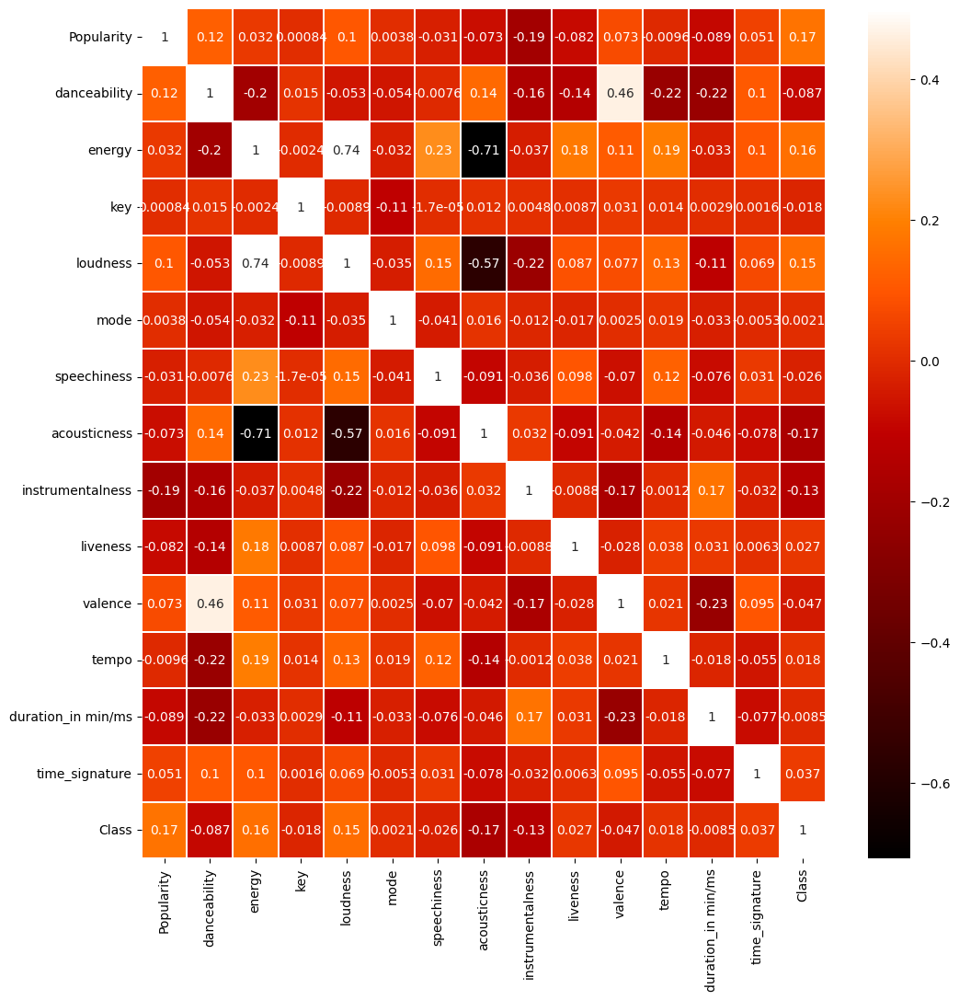

In [ ]:
'''
import seaborn as sns
import matplotlib.pyplot as plt

colormap = plt.cm.gist_heat # 그래프의 색상 구성을 정합니다.
plt.figure(figsize=(15, 15)) # 그래프의 크기를 정합니다.

sns.heatmap(train.corr(), linewidths=0.1, vmax=0.5, cmap=colormap, linecolor="white", annot=True)
plt.show()
'''

KeyboardInterrupt: 

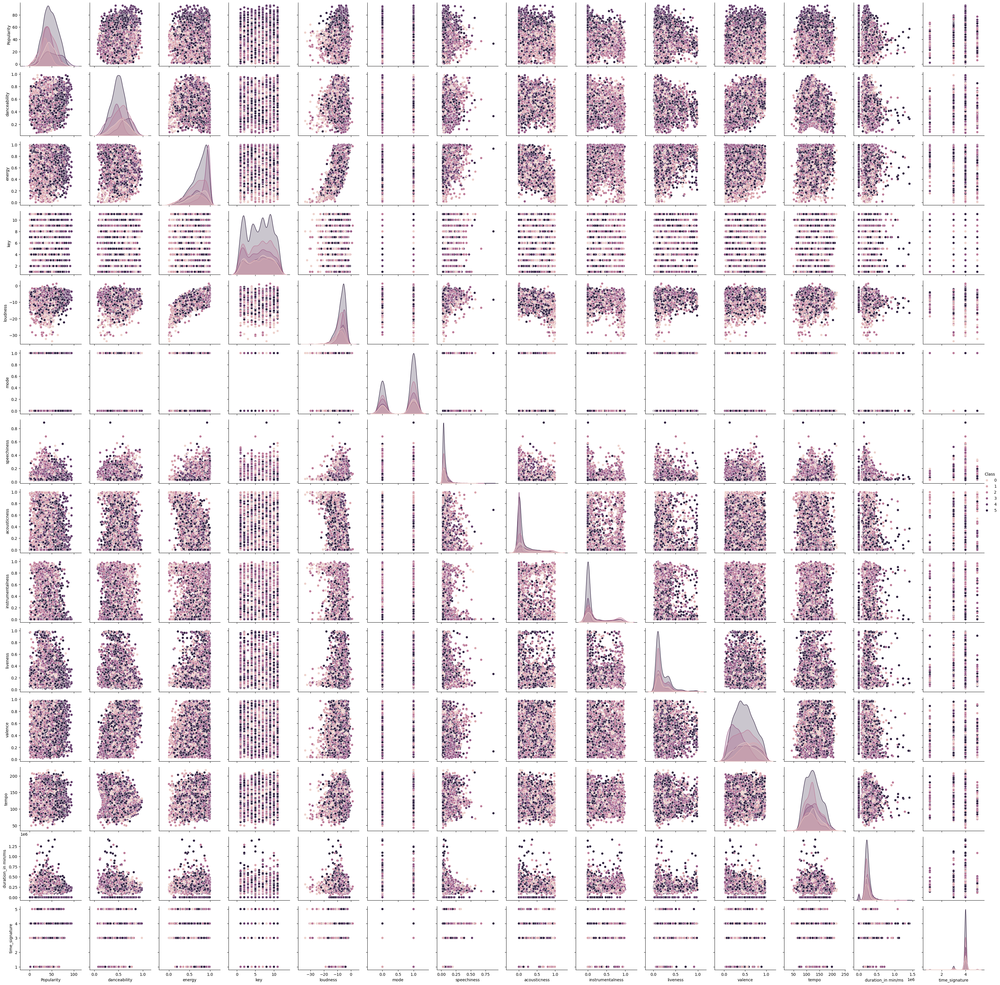

In [ ]:
'''
import seaborn as sns
import matplotlib.pyplot as plt
sns.pairplot(train, hue= "Class")
plt.show()
'''

In [ ]:
x = train[train.columns[:14]]
#x = train[['Popularity', 'energy', 'key', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature']]
print(x.columns)
y = train['Class']

print(type(x))
print(type(y))

print(x.shape)
print(y.shape)

Index(['Popularity', 'danceability', 'energy', 'key', 'loudness', 'mode',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'duration_in min/ms', 'time_signature'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.series.Series'>
(7783, 14)
(7783,)


In [ ]:
x = x.to_numpy()
y = y.to_numpy()

print(type(x))
print(type(y))

print(x.shape)
print(y.shape)

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
(7783, 14)
(7783,)


In [ ]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y,
                                                  random_state=42)

In [ ]:
print(x_train.shape, y_train.shape)
print(x_test.shape, y_test.shape)

(5837, 14) (5837,)
(1946, 14) (1946,)


In [ ]:
'''
from sklearn.model_selection import train_test_split

x_sub, x_val, y_sub, y_val = train_test_split(x_train, y_train,
                                                  random_state=42)
                                                  '''

In [ ]:
'''
print(x_sub.shape, y_sub.shape)
print(x_val.shape, y_val.shape)
print(x_test.shape, y_test.shape)
'''

In [ ]:
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()


ss.fit(x_train) # mean, std

x_train_scaled = ss.transform(x_train)
#x_val_scaled = ss.transform(x_val)
x_test_scaled = ss.transform(x_test)

In [ ]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()

In [ ]:
# 랜덤 서치!!!
from scipy.stats import uniform, randint

ran_generator1 = randint(0, 10) # 정수값 난수 생성기 객체를 반환해줌!

print(ran_generator1.rvs(100))

[3 9 0 4 1 1 9 1 1 7 7 2 8 0 0 5 8 7 6 5 3 8 3 0 3 2 7 6 1 5 4 0 6 5 0 9 6
 2 8 4 6 5 9 5 6 0 5 2 7 4 9 9 1 6 9 2 3 3 5 7 8 9 7 2 8 4 7 1 6 7 8 3 8 8
 5 7 3 5 5 6 1 2 4 2 1 2 3 5 2 8 5 7 9 0 1 1 0 9 8 4]


In [ ]:
ran_generator2 = uniform(0, 1) # 실수값 난수 생성기 객체
print(ran_generator2.rvs(10))

[0.17839176 0.88745077 0.1838125  0.45727042 0.52072399 0.17984871
 0.46067089 0.92123503 0.00892404 0.85977803]


In [ ]:
from sklearn.model_selection import RandomizedSearchCV

parameters = {'C': randint(1,20),
              'penalty': ['l1', 'l2'],
              'tol': uniform(1e-10, 1e10),
              'solver': ['liblinear', 'saga']}

rs = RandomizedSearchCV(LogisticRegression(), parameters,
                       n_jobs=-1)

In [ ]:
rs.fit(x_train_scaled, y_train)

lr = rs.best_estimator_

print("학습용:", lr.score(x_train_scaled, y_train)) # 정확도!! (분류 문제라서) (회귀 문제일 때는 R^2)
print("시험용:", lr.score(x_test_scaled, y_test))

학습용: 0.4613671406544458
시험용: 0.4516957862281603


In [ ]:
print(rs.best_params_)

{'C': 17, 'penalty': 'l1', 'solver': 'saga', 'tol': 4157620620.5974164}


In [ ]:
from sklearn.model_selection import GridSearchCV

parameters = {'C':[1e-3, 1e-2, 1e-1, 1e0, 1, 2, 3, 4]}

gs = GridSearchCV(LogisticRegression(), parameters,
                  n_jobs=-1 # 기본값=1, -1로 지정하면 모든 core 자원을 활용하기 때문에 빠른 결과를 얻을 수 있다!
                  # k=5 <- 5-fold CV가 기본값으로 적용됨!
                 )

# CPU -> 계산(연산)을 담당하고 있을 것임!
# GPU -> 지금 이용하지 않고 있음!

In [ ]:
gs.fit(x_train_scaled, y_train)

GridSearchCV(estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': [0.001, 0.01, 0.1, 1.0, 1, 2, 3, 4]})

In [ ]:
lr = gs.best_estimator_

print("학습용:", lr.score(x_train_scaled, y_train)) # 정확도!! (분류 문제라서) (회귀 문제일 때는 R^2)
print("시험용:", lr.score(x_test_scaled, y_test))

학습용: 0.4678773342470447
시험용: 0.4645426515930113


In [ ]:
gs.best_params_ # # parameter --> params

{'C': 1.0}

In [ ]:
print(gs.cv_results_['mean_test_score']) # 8개 <-- C의 경우의 수

[0.41220009 0.4620557  0.4649696  0.46599714 0.46599714 0.4654833
 0.46565468 0.46548344]


In [ ]:
parameters = {'C':[1e-3, 1e-2, 1e-1, 1e0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
              'penalty': ['l1', 'l2'], # 2
              'tol': [1e-5, 1e-4, 1e-3, 1e-2, 1e-1],
              'solver': ['liblinear', 'saga']} # 기울기 값을 최소화시키는 방향으로 진행하는데 # 2

gs = GridSearchCV(LogisticRegression(), parameters,
                  n_jobs=-1 # 기본값=1, -1로 지정하면 모든 core 자원을 활용하기 때문에 빠른 결과를 얻을 수 있다!
                  # k=5 <- 5-fold CV가 기본값으로 적용됨!
                 )

In [ ]:
gs.fit(x_train_scaled, y_train)

lr = gs.best_estimator_

print("학습용:", lr.score(x_train_scaled, y_train)) # 정확도!! (분류 문제라서) (회귀 문제일 때는 R^2)
print("시험용:", lr.score(x_test_scaled, y_test))

학습용: 0.4670207298269659
시험용: 0.4671120246659815


In [ ]:
print(gs.best_params_)

{'C': 1, 'penalty': 'l2', 'solver': 'saga', 'tol': 0.1}


In [ ]:
from sklearn.model_selection import RandomizedSearchCV

parameters = {'loss': ["log_loss", "hinge"],
              'max_iter': randint(1, 250),
              'penalty': ['l1', 'l2'],
              'tol': uniform(1e-10, 1e10)}

rs = RandomizedSearchCV(SGDClassifier(random_state=42), parameters,
                       n_jobs=-1)

In [ ]:
rs.fit(x_train_scaled, y_train)

lr = rs.best_estimator_

print("학습용:", lr.score(x_train_scaled, y_train)) # 정확도!! (분류 문제라서) (회귀 문제일 때는 R^2)
print("시험용:", lr.score(x_test_scaled, y_test))

학습용: 0.41596710639026896
시험용: 0.40493319630010277


In [ ]:
print(rs.best_params_)

{'loss': 'log_loss', 'max_iter': 166, 'penalty': 'l1', 'tol': 7732916103.595967}


In [ ]:
parameters = {'loss': ["log_loss", "hinge"],
              'max_iter': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13 ,14, 15, 16, 17, 18, 19, 20],
              'penalty': ['l1', 'l2'],
              'tol': [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2, 1e3]}

gs = GridSearchCV(SGDClassifier(random_state=42), parameters,
                  n_jobs=-1 # 기본값=1, -1로 지정하면 모든 core 자원을 활용하기 때문에 빠른 결과를 얻을 수 있다!
                  # k=5 <- 5-fold CV가 기본값으로 적용됨!
                 )

In [ ]:
gs.fit(x_train_scaled, y_train)

lr = gs.best_estimator_

print("학습용:", lr.score(x_train_scaled, y_train)) # 정확도!! (분류 문제라서) (회귀 문제일 때는 R^2)
print("시험용:", lr.score(x_test_scaled, y_test))

학습용: 0.4271029638512935
시험용: 0.42189105858170606


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_stochastic_gradient.py:702: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(


In [ ]:
print(gs.best_params_)

{'loss': 'log_loss', 'max_iter': 16, 'penalty': 'l1', 'tol': 0.01}


In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier(random_state=42)
dt.fit(x_train, y_train)
print("훈련 세트:", dt.score(x_train, y_train))
print("시험 세트:", dt.score(x_test, y_test))

훈련 세트: 0.9229056021929073
시험 세트: 0.31346351490236385


In [ ]:
 print(dt.feature_importances_)

[0.08690908 0.08193452 0.07846386 0.04281062 0.07126164 0.01027809
 0.07509972 0.12768394 0.09105638 0.07276701 0.09884739 0.06408786
 0.09293758 0.00586229]


In [ ]:
import numpy as np
from sklearn.model_selection import cross_validate
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_jobs=-1, random_state=42)
scores = cross_validate(rf, x_train, y_train, return_train_score=True, n_jobs=-1)
print("훈련 세트:", np.mean(scores["train_score"]))
print("시험 세트:", np.mean(scores["test_score"]))

훈련 세트: 0.9381529730699043
시험 세트: 0.4543440621661913


In [ ]:
rf.fit(x_train, y_train)
print(rf.feature_importances_)

[0.08466863 0.09458909 0.08797576 0.04353302 0.07438803 0.01326604
 0.08078877 0.11151914 0.08995697 0.06817314 0.08523291 0.06806374
 0.0898124  0.00803235]


In [ ]:
rf = RandomForestClassifier(oob_score=True, n_jobs=-1, random_state=42)
rf.fit(x_train, y_train)
print(rf.oob_score_)

0.4372108960082234


In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
et = ExtraTreesClassifier(n_jobs=-1, random_state=42)
scores = cross_validate(et, x_train, y_train, return_train_score=True, n_jobs=-1)

print("훈련 세트:", np.mean(scores["train_score"]))
print("시험 세트:", np.mean(scores["test_score"]))

훈련 세트: 0.9381529730699043
시험 세트: 0.45280135225552


In [ ]:
et.fit(x_train, y_train)
print(et.feature_importances_)

[0.08623112 0.09145721 0.09158658 0.06087152 0.07166037 0.02453491
 0.07416042 0.09781381 0.08453759 0.06684749 0.08767717 0.06636296
 0.07856027 0.01769857]


In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
gb = GradientBoostingClassifier(random_state=42)
scores = cross_validate(gb, x_train, y_train, return_train_score=True, n_jobs=-1)

print("훈련 세트:", np.mean(scores["train_score"]))
print("시험 세트:", np.mean(scores["test_score"]))

훈련 세트: 0.6472503729780872
시험 세트: 0.48878079844114986


In [ ]:
gb.fit(x_train, y_train)

GradientBoostingClassifier(random_state=42)

In [ ]:
gb = GradientBoostingClassifier(n_estimators=500, learning_rate=0.2,
random_state=42)
scores = cross_validate(gb, x_train, y_train, return_train_score=True, n_jobs=-1)

print("훈련 세트:", np.mean(scores["train_score"]))
print("시험 세트:", np.mean(scores["test_score"]))

훈련 세트: 0.9371679073280734
시험 세트: 0.43258853634773625


In [ ]:
gb.fit(x_train, y_train)
print(gb.feature_importances_)

[0.07758898 0.09789039 0.07976856 0.01501122 0.07030343 0.00313382
 0.06993288 0.16086302 0.08899116 0.05537903 0.09299023 0.06512439
 0.11524562 0.00777726]


In [ ]:
# 학습용 데이터셋
import pandas as pd

test = pd.read_csv("test.csv")

print(type(test))
print(test.shape)
#print(test)

<class 'pandas.core.frame.DataFrame'>
(1946, 14)


In [ ]:
test_scaled = ss.transform(test)
print(test_scaled.shape)

(1946, 14)


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


In [ ]:
y_pred = gb.predict(test)

print(gb.score(test, y_pred))
print(y_pred)

1.0
[5 5 2 ... 5 5 3]


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but GradientBoostingClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but GradientBoostingClassifier was fitted without feature names
  warnings.warn(


In [ ]:
import numpy as np

count_0 = np.count_nonzero(y_pred == 0)  # 0의 개수 np.unique(y_train, return counts=TRUE)
count_1 = np.count_nonzero(y_pred == 1)  # 1의 개수
count_2 = np.count_nonzero(y_pred == 2)  # 2의 개수
count_3 = np.count_nonzero(y_pred == 3)  # 3의 개수
count_4 = np.count_nonzero(y_pred == 4)  # 4의 개수
count_5 = np.count_nonzero(y_pred == 5)  # 5의 개수

print("0의 개수:", count_0)
print("1의 개수:", count_1)
print("2의 개수:", count_2)
print("3의 개수:", count_3)
print("4의 개수:", count_4)
print("5의 개수:", count_5)

len(y_pred)

0의 개수: 136
1의 개수: 161
2의 개수: 418
3의 개수: 288
4의 개수: 167
5의 개수: 776


1946

In [ ]:
import numpy as np

df = pd.read_csv("submission.csv")

df.dropna(axis=1, inplace=True)

# 아래 "np.arange(0, df.shape[0], 1)" 부분을, 솜솜이가 만든 모델이 예측한 값으로 대체!
#y_pred = np.arange(0, df.shape[0], 1)

df["Score"] = y_pred
df.to_csv("submission(20211689)_6.csv", index=False)